Zadanie 13


image 1/1 c:\Users\joann\Documents\DataScience\LearnIT\CODE\pythonProject\img\2005_08_05_GDANSK_00.jpeg: 480x640 1 bench, 56.6ms
Speed: 2.8ms preprocess, 56.6ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


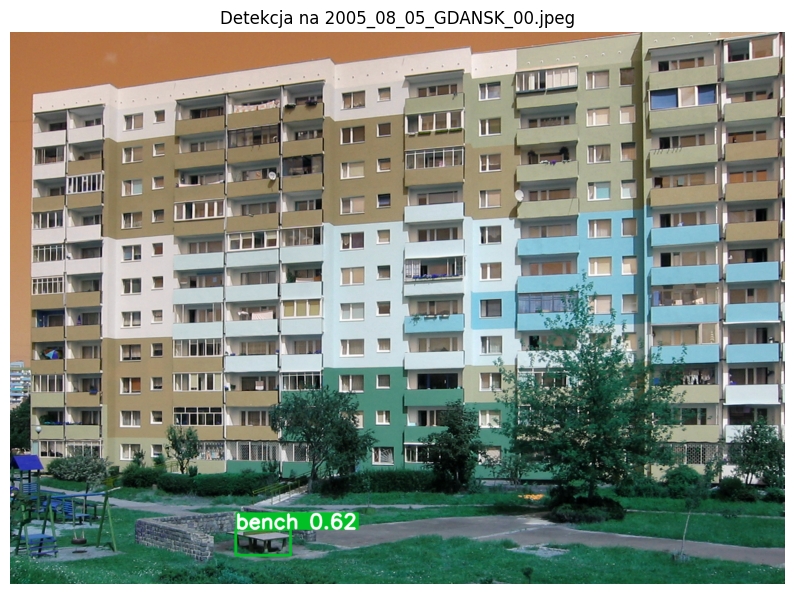


image 1/1 c:\Users\joann\Documents\DataScience\LearnIT\CODE\pythonProject\img\2014_Klacz_i_rebi_01.jpg: 384x640 2 horses, 48.6ms
Speed: 2.4ms preprocess, 48.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


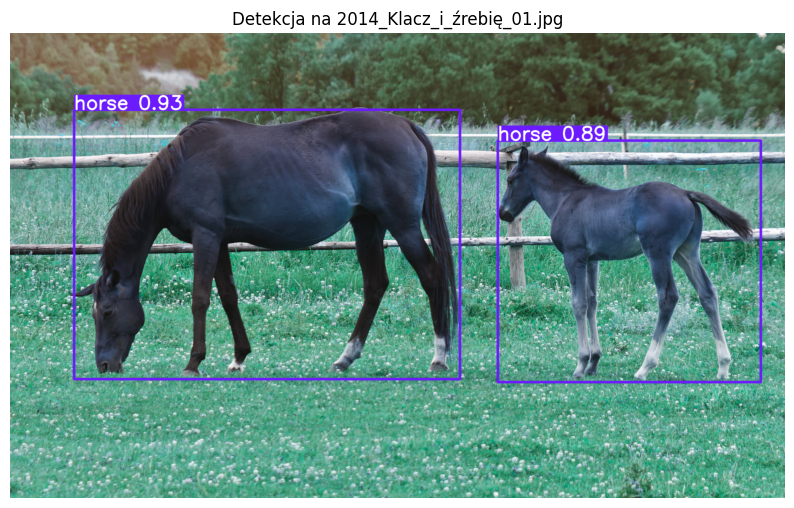


image 1/1 c:\Users\joann\Documents\DataScience\LearnIT\CODE\pythonProject\img\Cat03.jpg: 640x640 1 cat, 80.4ms
Speed: 8.4ms preprocess, 80.4ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


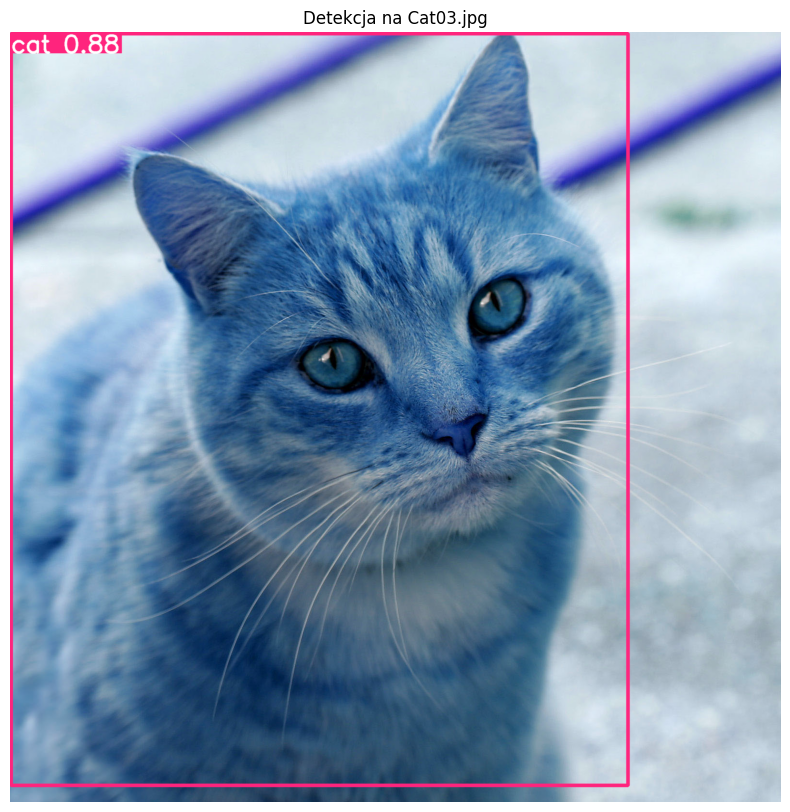


image 1/1 c:\Users\joann\Documents\DataScience\LearnIT\CODE\pythonProject\img\Fliegerwerft_2008_Borkum_061.jpg: 448x640 1 airplane, 49.3ms
Speed: 2.7ms preprocess, 49.3ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)


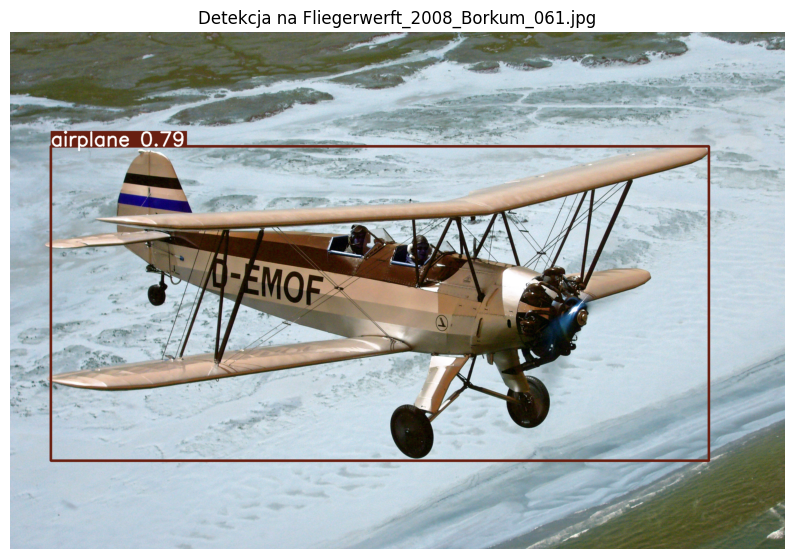


image 1/1 c:\Users\joann\Documents\DataScience\LearnIT\CODE\pythonProject\img\Krowa.jpg: 416x640 1 cow, 48.1ms
Speed: 2.1ms preprocess, 48.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


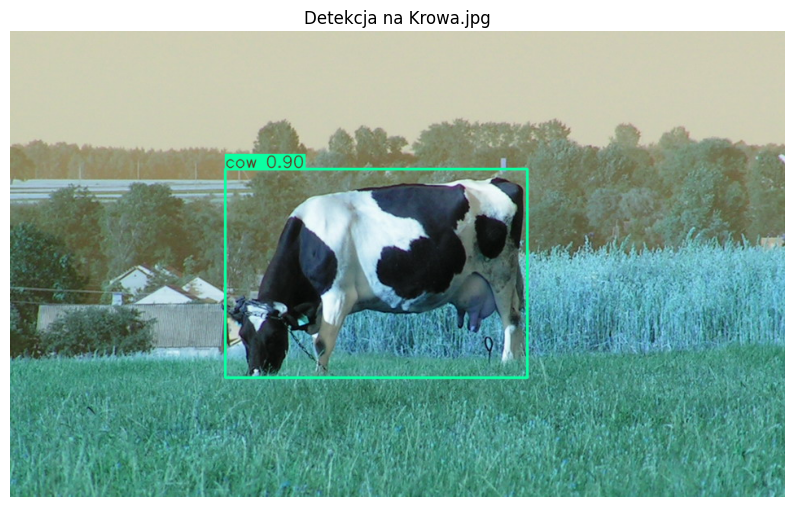


image 1/1 c:\Users\joann\Documents\DataScience\LearnIT\CODE\pythonProject\img\Left_side_of_Flying_Pigeon.jpg: 448x640 2 persons, 3 bicycles, 2 cars, 49.5ms
Speed: 4.6ms preprocess, 49.5ms inference, 0.9ms postprocess per image at shape (1, 3, 448, 640)


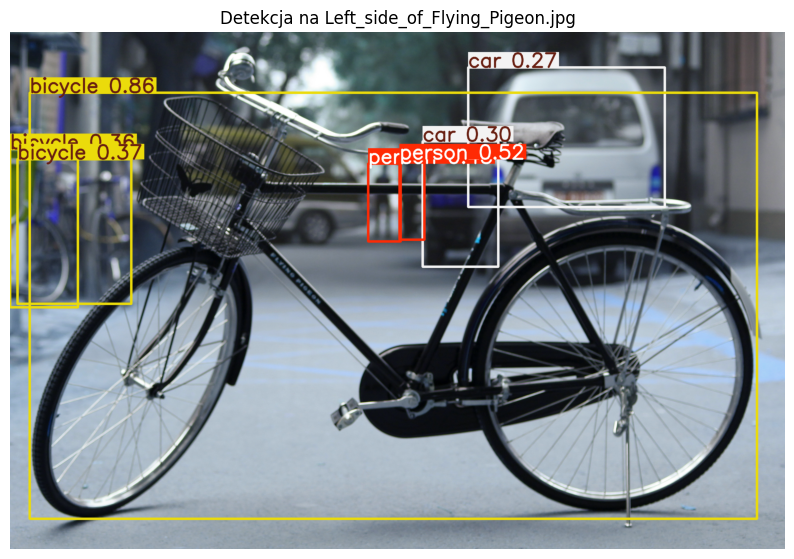


image 1/1 c:\Users\joann\Documents\DataScience\LearnIT\CODE\pythonProject\img\LG_Flatron_stereo-tv.jpg: 608x640 1 tv, 88.9ms
Speed: 8.6ms preprocess, 88.9ms inference, 21.0ms postprocess per image at shape (1, 3, 608, 640)


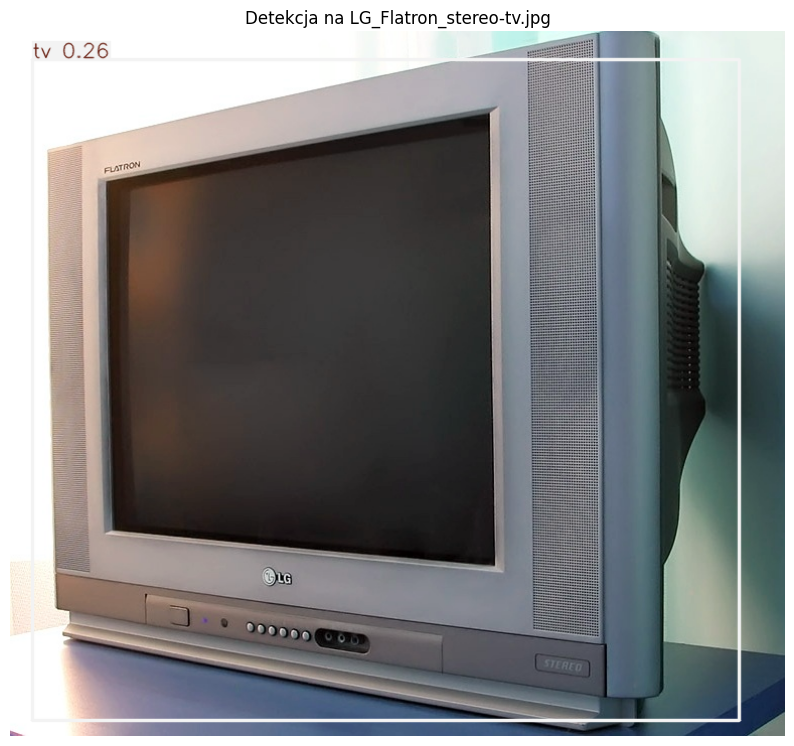


image 1/1 c:\Users\joann\Documents\DataScience\LearnIT\CODE\pythonProject\img\Renault_Laguna_III_Phase_I_front-1.jpg: 352x640 4 cars, 128.6ms
Speed: 2.6ms preprocess, 128.6ms inference, 0.9ms postprocess per image at shape (1, 3, 352, 640)


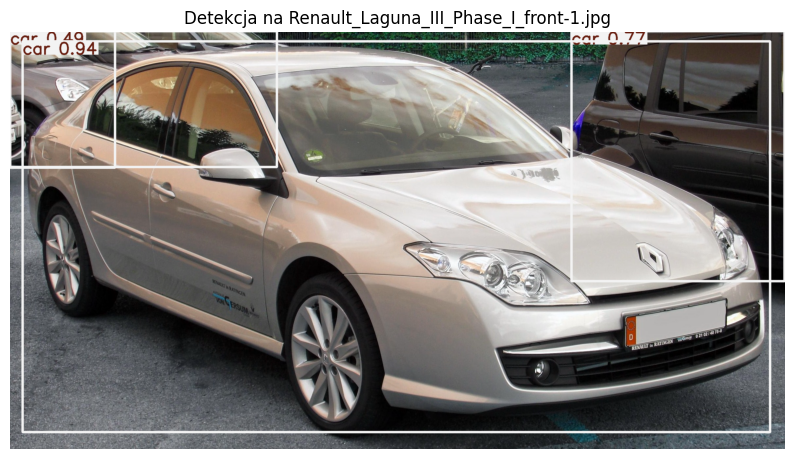


image 1/1 c:\Users\joann\Documents\DataScience\LearnIT\CODE\pythonProject\img\Ruch_uliczny_w_Alejach_Jerozolimskich_w_Warszawie_w_latach_60.jpg: 640x448 11 persons, 3 cars, 2 buss, 85.6ms
Speed: 3.7ms preprocess, 85.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 448)


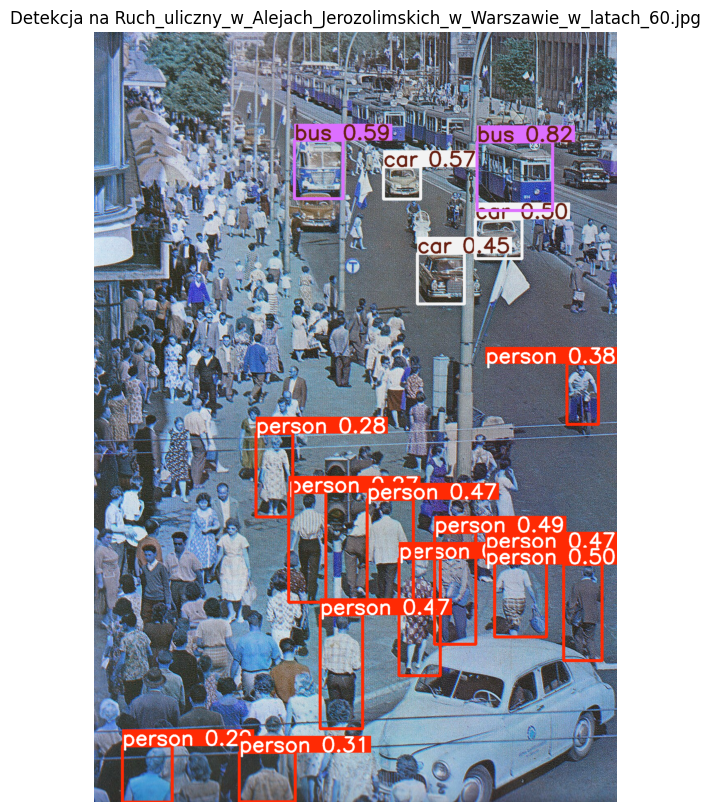


image 1/1 c:\Users\joann\Documents\DataScience\LearnIT\CODE\pythonProject\img\Ursus_1604_Traktor.jpg: 480x640 1 truck, 76.3ms
Speed: 1.9ms preprocess, 76.3ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


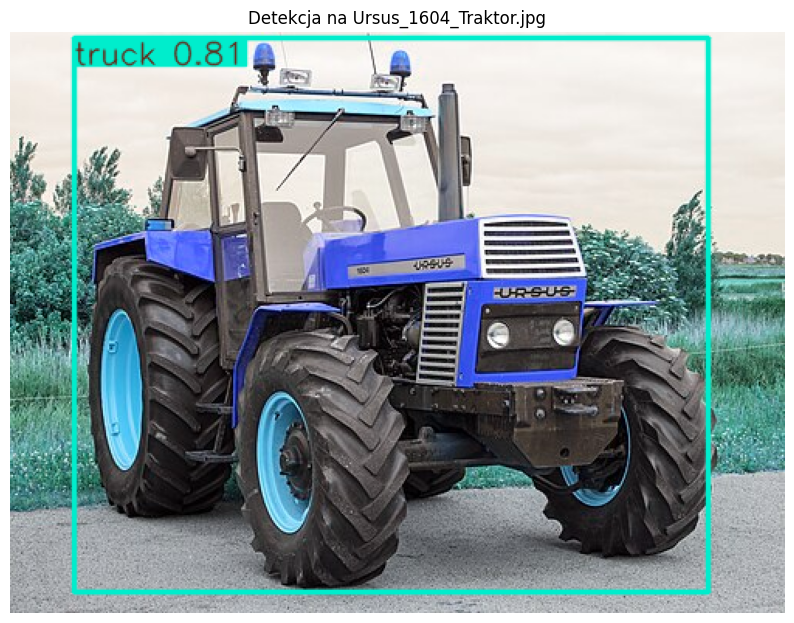

In [13]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import requests 
from PIL import Image
import io
import os


model = YOLO('yolov8n.pt')

image_dir = 'img'

image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.jpeg', '.png'))][:10]

for image_file in image_files:
    image_path = os.path.join(image_dir, image_file)
    image = Image.open(image_path)
    results = model(image_path)
    plt.figure(figsize=(10, 10))
    plt.imshow(results[0].plot())
    plt.title(f'Detekcja na {image_file}')
    plt.axis('off')
    plt.show()

Własne zadanie

Device: cpu
Epoch 1/3 | loss=0.4006 | acc=0.9013
Epoch 2/3 | loss=0.1796 | acc=0.9498
Epoch 3/3 | loss=0.1497 | acc=0.9554
Embeddings shape: torch.Size([10000, 512])


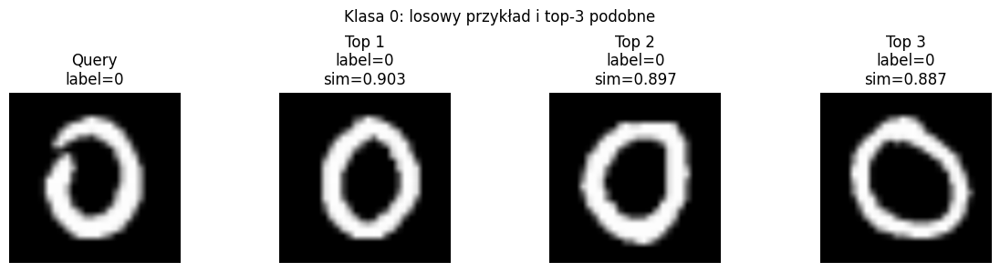

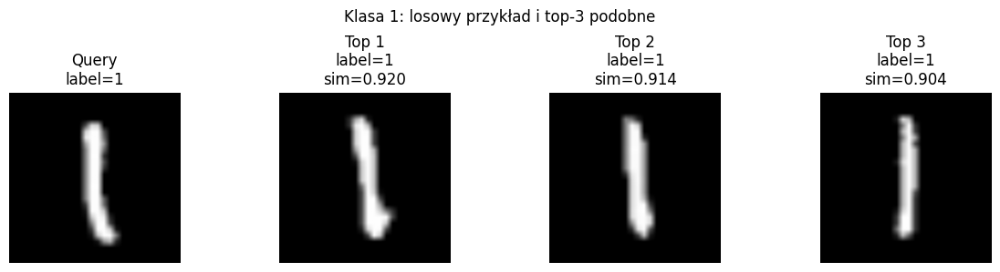

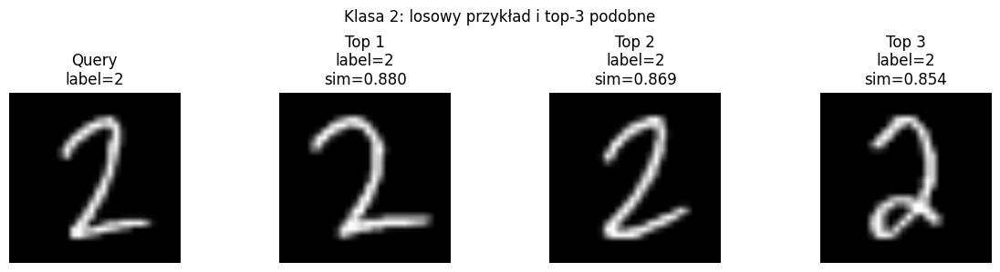

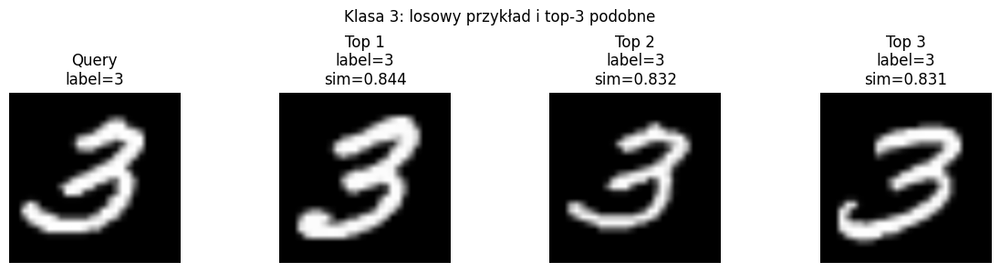

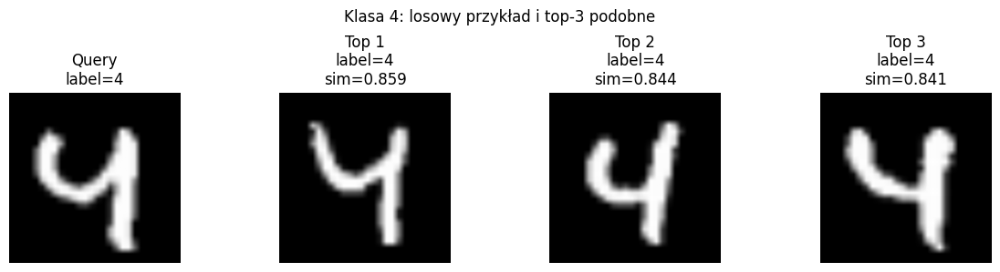

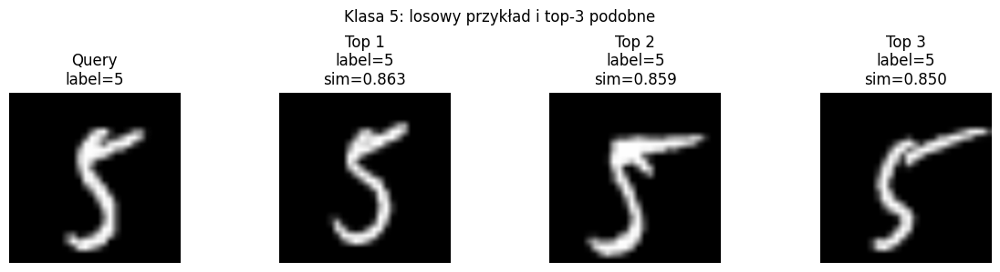

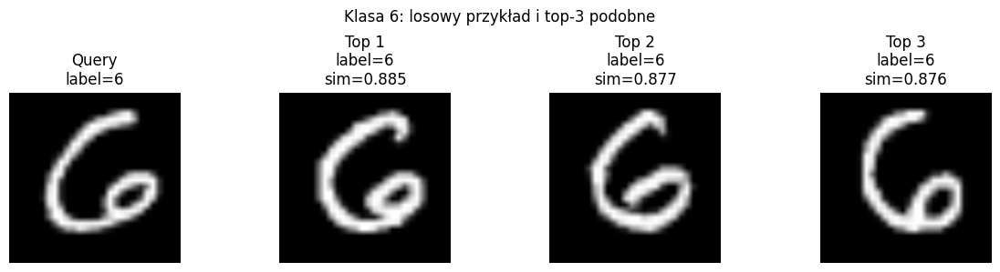

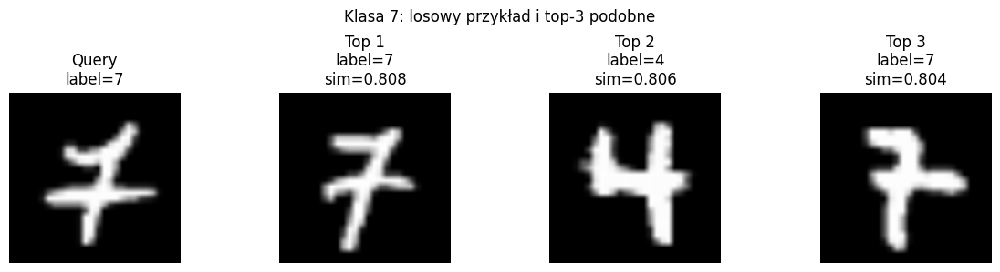

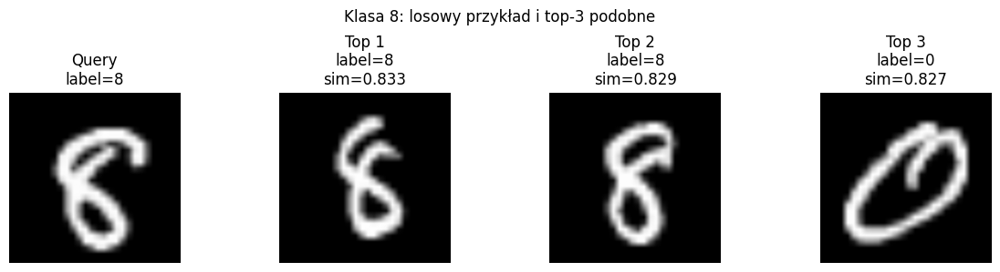

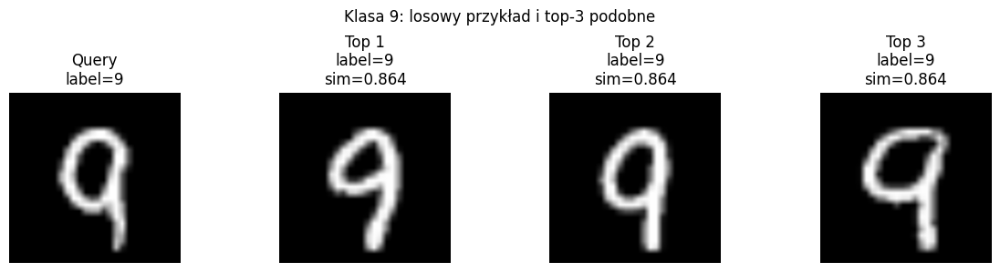

In [ ]:
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
from torchvision.models import ResNet18_Weights

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)


transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.Grayscale(num_output_channels=3),  # zachowujemy pretrained conv1
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

transform_vis = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.Grayscale(num_output_channels=3),
    transforms.ToTensor()
])

train_dataset = datasets.MNIST(root="./data", train=True, download=True, transform=transform)
test_dataset  = datasets.MNIST(root="./data", train=False, download=True, transform=transform)

test_dataset_vis = datasets.MNIST(root="./data", train=False, download=True, transform=transform_vis)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=2)
test_loader  = DataLoader(test_dataset, batch_size=128, shuffle=False, num_workers=2)

weights = ResNet18_Weights.DEFAULT
model = models.resnet18(weights=weights)

for param in model.parameters():
    param.requires_grad = False

num_features = model.fc.in_features
model.fc = nn.Linear(num_features, 10)

for param in model.fc.parameters():
    param.requires_grad = True

model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.fc.parameters(), lr=1e-3)

epochs = 3

for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total
    print(f"Epoch {epoch+1}/{epochs} | loss={epoch_loss:.4f} | acc={epoch_acc:.4f}")

class ResNet18Embedding(nn.Module):
    def __init__(self, backbone):
        super().__init__()
        self.features = nn.Sequential(*list(backbone.children())[:-1])  # bez fc

    def forward(self, x):
        x = self.features(x)       
        x = torch.flatten(x, 1)   
        return x

embedding_model = ResNet18Embedding(model).to(device)
embedding_model.eval()

all_embeddings = []
all_labels = []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        emb = embedding_model(images)          
        emb = F.normalize(emb, p=2, dim=1)    

        all_embeddings.append(emb.cpu())
        all_labels.append(labels)

all_embeddings = torch.cat(all_embeddings, dim=0)  
all_labels = torch.cat(all_labels, dim=0)          

print("Embeddings shape:", all_embeddings.shape)

random.seed(42)
np.random.seed(42)

class_to_indices = {c: (all_labels == c).nonzero(as_tuple=True)[0].tolist() for c in range(10)}

def get_vis_image(idx):
    img, label = test_dataset_vis[idx]
    return img.permute(1, 2, 0).numpy(), label

for cls in range(10):
    query_idx = random.choice(class_to_indices[cls])

    query_emb = all_embeddings[query_idx].unsqueeze(0) 

    sims = torch.mm(query_emb, all_embeddings.T).squeeze(0) 

    sims[query_idx] = -1.0

    topk = torch.topk(sims, k=3)
    top_indices = topk.indices.tolist()
    top_scores = topk.values.tolist()

    fig, axes = plt.subplots(1, 4, figsize=(12, 3))

    query_img, query_label = get_vis_image(query_idx)
    axes[0].imshow(query_img)
    axes[0].set_title(f"Query\nlabel={query_label}")
    axes[0].axis("off")

    for i, (idx, score) in enumerate(zip(top_indices, top_scores), start=1):
        img, lbl = get_vis_image(idx)
        axes[i].imshow(img)
        axes[i].set_title(f"Top {i}\nlabel={lbl}\nsim={score:.3f}")
        axes[i].axis("off")

    plt.suptitle(f"Klasa {cls}: losowy przykład i top-3 podobne")
    plt.tight_layout()
    plt.show()